In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
import os
import numpy as np
import glob
from os import listdir
from os.path import isfile, join
from google.colab.patches import cv2_imshow

In [3]:
mypath='/content/drive/Shareddrives/Bangla Digit Recognition (Own Data) /Dhaka'

onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]

images = np.empty(len(onlyfiles), dtype=object)

for n in range(0, len(onlyfiles)):
  images[n] = cv2.imread( join(mypath,onlyfiles[n]) )

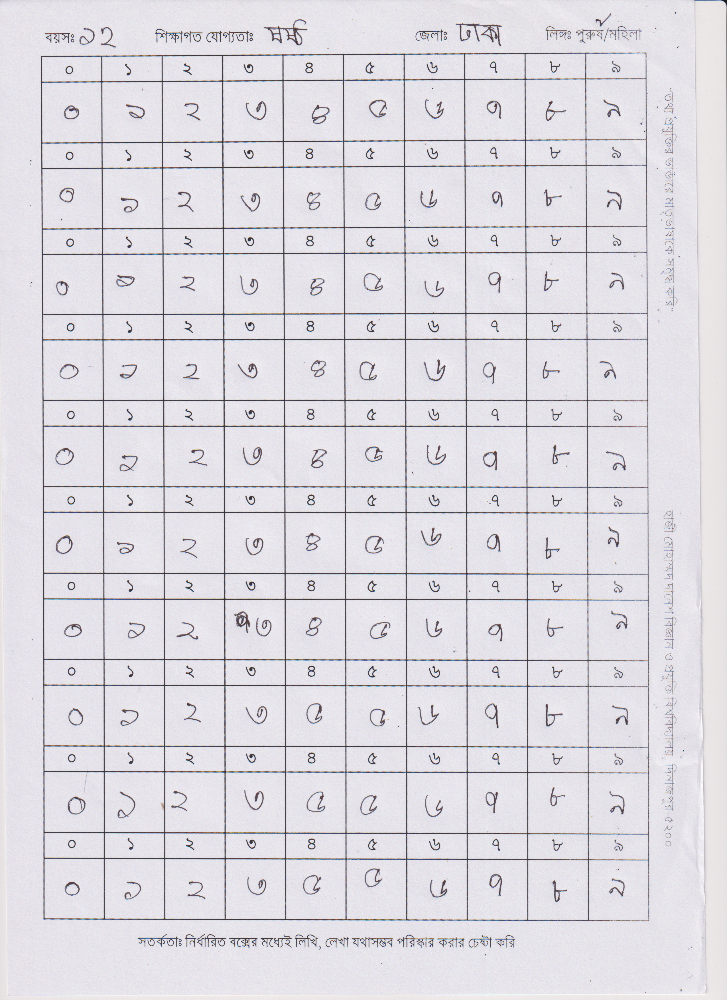

In [ ]:
cv2_imshow(images[0])

In [ ]:
def Digit_crop(images):
  for i in range(len(images)):
    #image = cv2.imread('/content/drive/Shareddrives/Bangla Digit Recognition (Own Data) /Narsingdi/NARS (1).bmp')

    gray = cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY)
    blur = cv2.medianBlur(gray, 5)
    sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    sharpen = cv2.filter2D(blur, -1, sharpen_kernel)
    thresh = cv2.threshold(sharpen,160,255, cv2.THRESH_BINARY_INV)[1]
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cnts = cv2.findContours(close, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]


    min_area = 25500
    max_area = 155000


    image_number = 0
    #i=1

    for c in cnts:
        area = cv2.contourArea(c)
            
        if area > min_area and area < max_area:
            
            x,y,w,h = cv2.boundingRect(c)
            
            test3 = images[i][y+10:y+h-10, x+10:x+w-10]
            
            #if i==9: 
              #i=1
            #Folder_name = ['ZERO','ONE', 'TWO', 'THREE', 'FOUR','FIVE','SIX','SEVEN','EIGHT','NINE']
            #directory = Folder_name[-i]   

            cv2.imwrite('/content/drive/Shareddrives/Bangla Digit Recognition (Own Data) /Dhaka_croped/img_{}_{}.png'.format(i,image_number), test3)
            
            cv2.rectangle(images[i], (x, y), (x + w, y + h), (36,255,12), 2)
            
            image_number = image_number+1
            #i =i+1

    #cv2_imshow(images[i])

    cv2.waitKey()

In [ ]:
Digit_crop(images)